In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Convolution2D, MaxPooling2D, Dropout, Flatten, Dense
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from imgaug import augmenters as iaa
import cv2
import pandas as pd
import ntpath
import random
import warnings
warnings.filterwarnings("ignore")

**Αυτό το κομμάτι του notebook προέρχεται από το επίσημο notebook της udacity στο kaggle: aslanahmedov/self-driving-car-behavioural-cloning**

**Χρησιμοποιείται το σύνολο δεδομένων udacity-self-driving-car-behavioural-cloning που παρέχεται από το Kaggle**

In [2]:
datadir = ''
columns = ['center', 'left', 'right', 'steering', 'throttle', 'reverse', 'speed']
data = pd.read_csv(os.path.join(datadir, '../input/udacity-self-driving-car-behavioural-cloning/self_driving_car_dataset_make/driving_log.csv'), names = columns)
pd.set_option('display.max_colwidth', -1)
data.head()

,center,left,right,steering,throttle,reverse,speed
0,C:\Users\Andy\Desktop\self_driving_car_dataset\IMG\center_2022_04_10_12_24_41_840.jpg,C:\Users\Andy\Desktop\self_driving_car_dataset\IMG\left_2022_04_10_12_24_41_840.jpg,C:\Users\Andy\Desktop\self_driving_car_dataset\IMG\right_2022_04_10_12_24_41_840.jpg,0.0,0.0,0,0.000013
1,C:\Users\Andy\Desktop\self_driving_car_dataset\IMG\center_2022_04_10_12_24_41_908.jpg,C:\Users\Andy\Desktop\self_driving_car_dataset\IMG\left_2022_04_10_12_24_41_908.jpg,C:\Users\Andy\Desktop\self_driving_car_dataset\IMG\right_2022_04_10_12_24_41_908.jpg,0.0,0.0,0,0.000010
2,C:\Users\Andy\Desktop\self_driving_car_dataset\IMG\center_2022_04_10_12_24_41_976.jpg,C:\Users\Andy\Desktop\self_driving_car_dataset\IMG\left_2022_04_10_12_24_41_976.jpg,C:\Users\Andy\Desktop\self_driving_car_dataset\IMG\right_2022_04_10_12_24_41_976.jpg,0.0,0.0,0,0.000008
3,C:\Users\Andy\Desktop\self_driving_car_dataset\IMG\center_2022_04_10_12_24_42_044.jpg,C:\Users\Andy\Desktop\self_driving_car_dataset\IMG\left_2022_04_10_12_24_42_044.jpg,C:\Users\Andy\Desktop\self_driving_car_dataset\IMG\right_2022_04_10_12_24_42_044.jpg,0.0,0.0,0,0.000021
4,C:\Users\Andy\Desktop\self_driving_car_dataset\IMG\center_2022_04_10_12_24_42_116.jpg,C:\Users\Andy\Desktop\self_driving_car_dataset\IMG\left_2022_04_10_12_24_42_116.jpg,C:\Users\Andy\Desktop\self_driving_car_dataset\IMG\right_2022_04_10_12_24_42_116.jpg,0.0,0.0,0,0.000014


Επεξεργασία των διευθύνσεων των εικόνων

In [3]:
def path_leaf(path):
  head, tail = ntpath.split(path)
  return tail
data['center'] = data['center'].apply(path_leaf)
data['left'] = data['left'].apply(path_leaf)
data['right'] = data['right'].apply(path_leaf)
data.head()

,center,left,right,steering,throttle,reverse,speed
0,center_2022_04_10_12_24_41_840.jpg,left_2022_04_10_12_24_41_840.jpg,right_2022_04_10_12_24_41_840.jpg,0.0,0.0,0,0.000013
1,center_2022_04_10_12_24_41_908.jpg,left_2022_04_10_12_24_41_908.jpg,right_2022_04_10_12_24_41_908.jpg,0.0,0.0,0,0.000010
2,center_2022_04_10_12_24_41_976.jpg,left_2022_04_10_12_24_41_976.jpg,right_2022_04_10_12_24_41_976.jpg,0.0,0.0,0,0.000008
3,center_2022_04_10_12_24_42_044.jpg,left_2022_04_10_12_24_42_044.jpg,right_2022_04_10_12_24_42_044.jpg,0.0,0.0,0,0.000021
4,center_2022_04_10_12_24_42_116.jpg,left_2022_04_10_12_24_42_116.jpg,right_2022_04_10_12_24_42_116.jpg,0.0,0.0,0,0.000014


Ευρεση διαφορετικών τιμών steering εντολής

In [4]:
num_bins = 25
samples_per_bin = 400
hist, bins = np.histogram(data['steering'], num_bins)

In [5]:
print(bins)

[-1.   -0.92 -0.84 -0.76 -0.68 -0.6  -0.52 -0.44 -0.36 -0.28 -0.2  -0.12
 -0.04  0.04  0.12  0.2   0.28  0.36  0.44  0.52  0.6   0.68  0.76  0.84
  0.92  1.  ]


Ιστόγραμμα τιμών steering στα δεδομένα

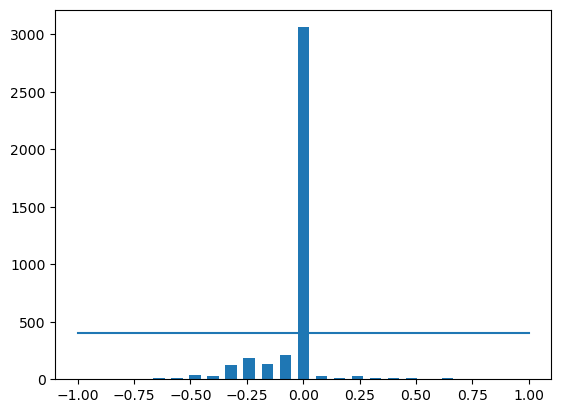

In [6]:
center = (bins[:-1]+ bins[1:]) * 0.5
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), \
(samples_per_bin, samples_per_bin))

In [7]:
print('total data:', len(data))

total data: 3930


Κρατάμε max 400 δείγματα από κάθε δυνατή τιμή steering για να έχουμε μια πιο ομοιόμορφη κατανομή και να μειώσουμε το bias

In [8]:
remove_list = []
for j in range(num_bins):
  list_ = []
  for i in range(len(data['steering'])):
    if data['steering'][i] >= bins[j] and data['steering'][i] <= bins[j+1]:
      list_.append(i)
  list_ = shuffle(list_)
  list_ = list_[samples_per_bin:]
  remove_list.extend(list_)
print('removed:', len(remove_list))

removed: 2661


In [9]:
data.drop(data.index[remove_list], inplace=True)
print('remaining:', len(data))

remaining: 1269


Η βελτιωμένη κατανομή

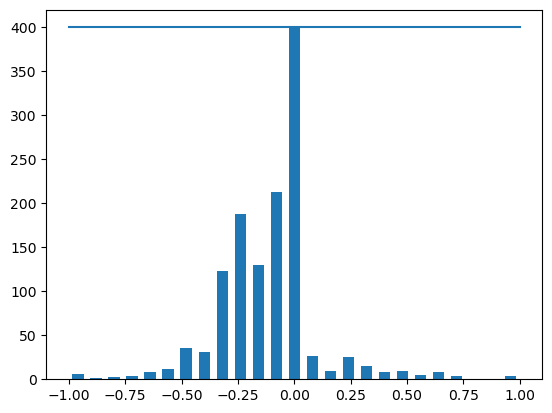

In [10]:
hist, _ = np.histogram(data['steering'], (num_bins))
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), \
(samples_per_bin, samples_per_bin))

In [11]:
print(data.iloc[1])

center      center_2022_04_10_12_24_42_256.jpg
left        left_2022_04_10_12_24_42_256.jpg  
right       right_2022_04_10_12_24_42_256.jpg 
steering   -0.05                              
throttle    0.01613                           
reverse     0                                 
speed       0.034646                          
Name: 6, dtype: object


Φορτώνουμε τις εικόνες. Για κάθε δείγμα έχουμε 3 εικόνες: right, left, center. Για να εκμετελλευτούμε και τις 3 εικόνες γνωρίζοντας τις γωνίες των καμερών φορτώνουμε steeing για την κεντρική ίσο με το steering που αντιστοιχεί σε αυτό το δείγμα και για την left με offset +0.15 ενώ για την right ίσο με -0.15.

In [12]:
def load_img_steering(datadir, df):
  image_path = []
  steering = []
  for i in range(len(data)):
    indexed_data = data.iloc[i]
    center, left, right = indexed_data[0], indexed_data[1], indexed_data[2]
    image_path.append(os.path.join(datadir, center.strip()))
    steering.append(float(indexed_data[3]))
    # left image append
    image_path.append(os.path.join(datadir,left.strip()))
    steering.append(float(indexed_data[3])+0.15)
    # right image append
    image_path.append(os.path.join(datadir,right.strip()))
    steering.append(float(indexed_data[3])-0.15)
  image_paths = np.asarray(image_path)
  steerings = np.asarray(steering)
  return image_paths, steerings
 
image_paths, steerings = load_img_steering(datadir + '../input/udacity-self-driving-car-behavioural-cloning/self_driving_car_dataset_make/IMG', data)

Χωρίσουμε σε train και validation. Το τεστ θα γίνει στο simulation.

In [13]:
X_train, X_valid, y_train, y_valid = train_test_split(image_paths, steerings, test_size=0.2, random_state=6)
print('Training Samples: {}\nValid Samples: {}'.format(len(X_train), len(X_valid)))

Training Samples: 3045
Valid Samples: 762


Text(0.5, 1.0, 'Validation set')

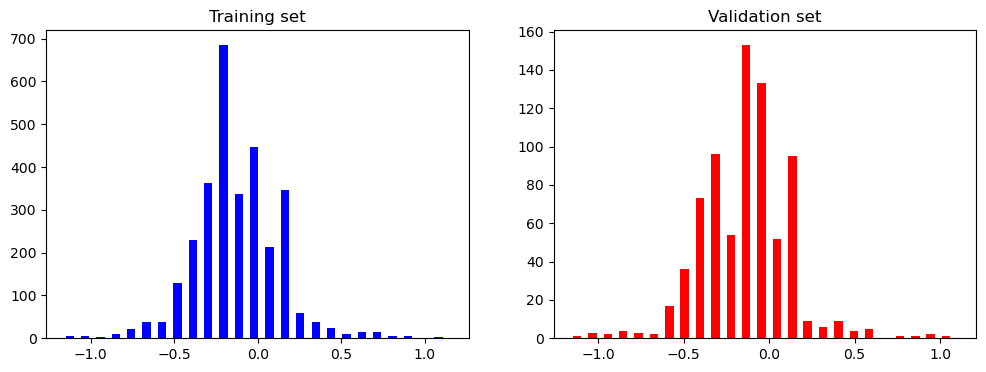

In [14]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].hist(y_train, bins=num_bins, width=0.05, color='blue')
axes[0].set_title('Training set')
axes[1].hist(y_valid, bins=num_bins, width=0.05, color='red')
axes[1].set_title('Validation set')

Ορίζονται παρακάτω 4 συναρτήσεις που χρησιμοποιούνται για dataset augmentation. Συγκεκριμένα η zoom κάνει scale μεταξύ 100% και 130%, η pan μετακινεί ανεξάρτητα τους δύο άξονες τυχαία από -10% έως 10%, η brightness αλλάζει την φωτειόντητα πολλαπλασιάζοντας την εικόνα με κάποιον παράγοντα,τέλος η flip αντικατοπτρίζει την εικόνα αλλάζοντας ωστόσο και το πρόσημο του steering.

Text(0.5, 1.0, 'Zoomed Image')

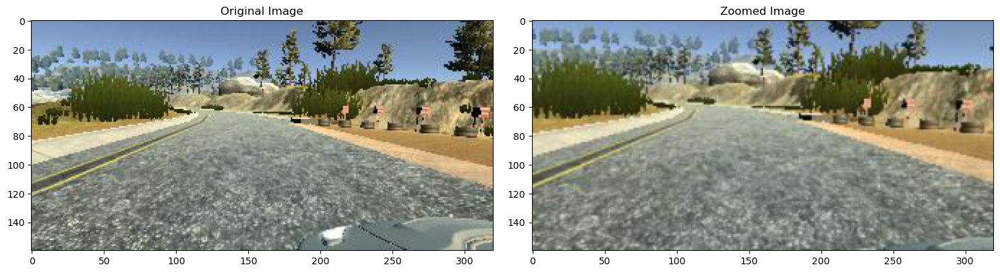

In [15]:
def zoom(image):
  zoom = iaa.Affine(scale=(1, 1.3))
  image = zoom.augment_image(image)
  return image
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
zoomed_image = zoom(original_image)
 
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
 
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
 
axs[1].imshow(zoomed_image)
axs[1].set_title('Zoomed Image')

Text(0.5, 1.0, 'Panned Image')

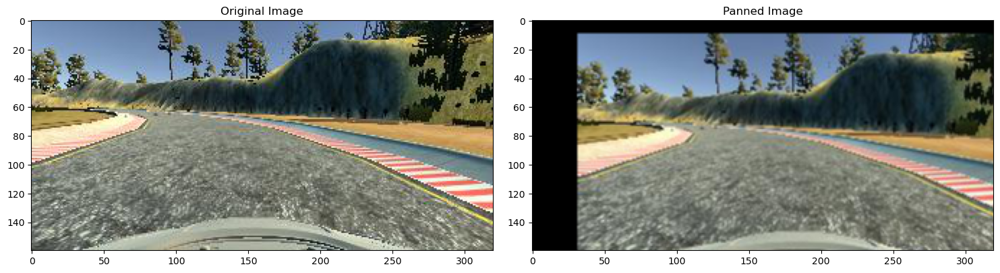

In [16]:
def pan(image):
  pan = iaa.Affine(translate_percent= {"x" : (-0.1, 0.1), "y": (-0.1, 0.1)})
  image = pan.augment_image(image)
  return image
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
panned_image = pan(original_image)
 
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
 
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
 
axs[1].imshow(panned_image)
axs[1].set_title('Panned Image')

Text(0.5, 1.0, 'Brightness altered image ')

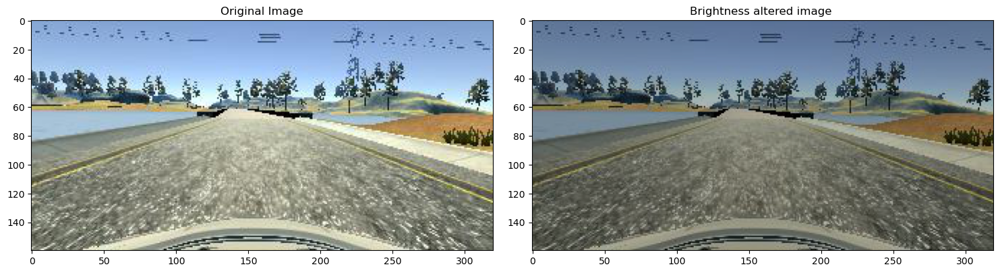

In [17]:
def img_random_brightness(image):
    brightness = iaa.Multiply((0.2, 1.2))
    image = brightness.augment_image(image)
    return image
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
brightness_altered_image = img_random_brightness(original_image)
 
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
 
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
 
axs[1].imshow(brightness_altered_image)
axs[1].set_title('Brightness altered image ')

Text(0.5, 1.0, 'Flipped Image - Steering Angle:-0.04999999999999999')

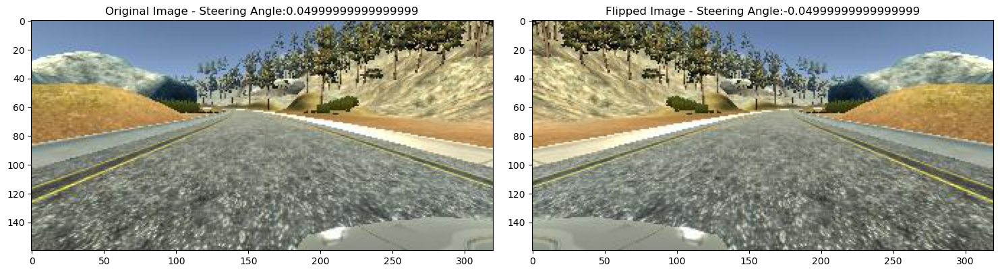

In [18]:
def img_random_flip(image, steering_angle):
    image = cv2.flip(image,1)
    steering_angle = -steering_angle
    return image, steering_angle
random_index = random.randint(0, 1000)
image = image_paths[random_index]
steering_angle = steerings[random_index]
 
 
original_image = mpimg.imread(image)
flipped_image, flipped_steering_angle = img_random_flip(original_image, steering_angle)
 
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
 
axs[0].imshow(original_image)
axs[0].set_title('Original Image - ' + 'Steering Angle:' + str(steering_angle))
 
axs[1].imshow(flipped_image)
axs[1].set_title('Flipped Image - ' + 'Steering Angle:' + str(flipped_steering_angle))

παράδειγμα για 10 εικόνες

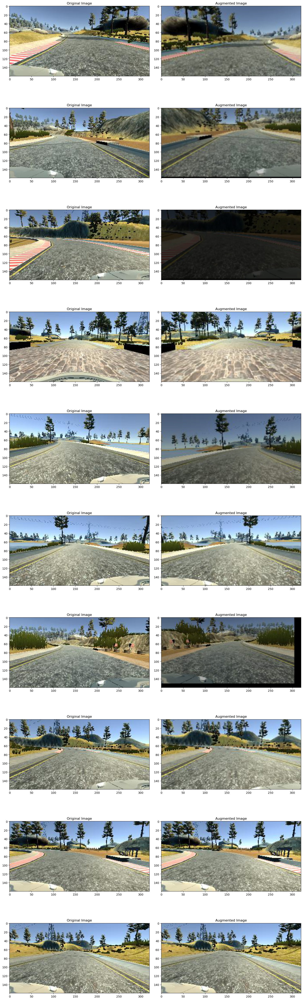

In [19]:
def random_augment(image, steering_angle):
    image = mpimg.imread(image)
    if np.random.rand() < 0.5:
      image = pan(image)
    if np.random.rand() < 0.5:
      image = zoom(image)
    if np.random.rand() < 0.5:
      image = img_random_brightness(image)
    if np.random.rand() < 0.5:
      image, steering_angle = img_random_flip(image, steering_angle)
    
    return image, steering_angle
ncol = 2
nrow = 10
 
fig, axs = plt.subplots(nrow, ncol, figsize=(15, 50))
fig.tight_layout()
 
for i in range(10):
  randnum = random.randint(0, len(image_paths) - 1)
  random_image = image_paths[randnum]
  random_steering = steerings[randnum]
    
  original_image = mpimg.imread(random_image)
  augmented_image, steering = random_augment(random_image, random_steering)
    
  axs[i][0].imshow(original_image)
  axs[i][0].set_title("Original Image")
  
  axs[i][1].imshow(augmented_image)
  axs[i][1].set_title("Augmented Image")

Επίσης για κάθε εικόνα περικόπτουμε τα χαρακτηριστικα πάνω από τον ορίζοντα που δεν παίζουν ρόλο στην οδήγηση, αλλάζουε σε YUV format, χρησιμοποιούμε gaussian blur, μειώνουμε το μέγεθος και κανονικοποιούμε τις τιμές.

Text(0.5, 1.0, 'Preprocessed Image')

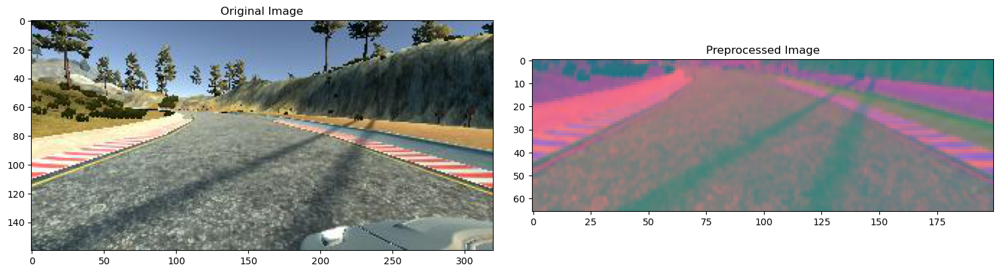

In [20]:
def img_preprocess(img):
    img = img[60:135,:,:]
    img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
    img = cv2.GaussianBlur(img,  (3, 3), 0)
    img = cv2.resize(img, (200, 66))
    img = img/255
    return img
image = image_paths[100]
original_image = mpimg.imread(image)
preprocessed_image = img_preprocess(original_image)
 
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
axs[1].imshow(preprocessed_image)
axs[1].set_title('Preprocessed Image')

Εφαρμόζουμε όλα τα παραπανω στην παρακάτω συνάρτηση όπου για κάθε εικόνα κάνουμε τυχαία μετατροπή(εάν προορίζεται για το σύνολο εκπαίδευσης) και επίσης τις εφαρόζουμε τις συναρτήσεις προεπεξεργασίας.

In [21]:
def batch_generator(image_paths, steering_ang, batch_size, istraining):
  
  while True:
    batch_img = []
    batch_steering = []
    
    for i in range(batch_size):
      random_index = random.randint(0, len(image_paths) - 1)
      
      if istraining:
        im, steering = random_augment(image_paths[random_index], steering_ang[random_index])
     
      else:
        im = mpimg.imread(image_paths[random_index])
        steering = steering_ang[random_index]
      
      im = img_preprocess(im)
      batch_img.append(im)
      batch_steering.append(steering)
    yield (np.asarray(batch_img), np.asarray(batch_steering)) 

Text(0.5, 1.0, 'Validation Image')

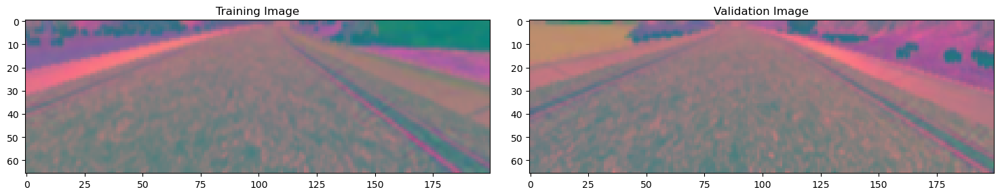

In [22]:
x_train_gen, y_train_gen = next(batch_generator(X_train, y_train, 1, 1))
x_valid_gen, y_valid_gen = next(batch_generator(X_valid, y_valid, 1, 0))
 
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
 
axs[0].imshow(x_train_gen[0])
axs[0].set_title('Training Image')
 
axs[1].imshow(x_valid_gen[0])
axs[1].set_title('Validation Image')

**από εδώ και πέρα ο κώδικας είναι προσωπική μου υλοποποίηση στα πλαίσια της εργασίας αυτής**

In [23]:
def dataset_preprocessing(image_paths, steering_ang, istraining):
    imag = []
    steering = []
    extras_img = []
    extras_steer = []
    if istraining :
        ind = np.arange(len(image_paths))
        to_augment = np.random.choice(ind, size=int(len(image_paths)*0.3), replace=False)
        for i in range(len(to_augment)) :
            img, steer =  random_augment(image_paths[to_augment[i]], steering_ang[to_augment[i]])
            extras_img.append(img)
            extras_steer.append(steer)
    orig = len(image_paths)
    for j in range((len(image_paths)+len(extras_img))):       
        if j>= orig : 
            im = img_preprocess(extras_img[j-orig])
            st = extras_steer[j-orig]
        else :
            im = img_preprocess(mpimg.imread(image_paths[j]))
            st = steering_ang[j]
        imag.append(im)
        steering.append(st)
    return np.array(imag), np.array(steering)

In [24]:
X_train_new, y_train_new = dataset_preprocessing(X_train, y_train, True)

In [25]:
X_val_new, y_val_new = dataset_preprocessing(X_valid, y_valid, False)

In [26]:
X_train_new.shape

(3958, 66, 200, 3)

In [27]:
y_train_new.shape

(3958,)

In [28]:
import torch
from torch.utils.data import TensorDataset, DataLoader
x = torch.Tensor(X_train_new)
y = torch.Tensor(y_train_new)
x_ = torch.Tensor(X_val_new) 
y_ = torch.Tensor(y_val_new)
x = x.permute(0, 3, 1, 2)
x_ = x_.permute(0, 3, 1, 2)

train_dataset = TensorDataset(x,y)
train_dataloader = DataLoader(train_dataset, batch_size=25) 

val_dataset = TensorDataset(x_,y_)
val_dataloader = DataLoader(val_dataset, batch_size=25) 

Feature batch shape: torch.Size([25, 3, 66, 200])
Labels batch shape: torch.Size([25])


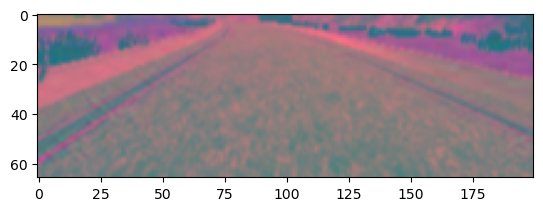

Label: -0.25


In [29]:
train_features, train_labels = next(iter(train_dataloader))
print(f"Feature batch shape: {train_features.size()}")
print(f"Labels batch shape: {train_labels.size()}")
img = train_features[0].squeeze()
label = train_labels[0]
plt.imshow(img.permute(1, 2, 0), cmap="gray")
plt.show()
print(f"Label: {label}")


In [30]:
import torch.nn as nn
import torch.nn.functional as F

class NVIDIAbehcloning(nn.Module):
    def __init__(self):
        super(NVIDIAbehcloning, self).__init__()
        self.conv1 = nn.Conv2d(3, 24, (5,5), stride=(2,2))
        self.elu = nn.ELU()
        self.conv2 = nn.Conv2d(24, 36, (5,5), stride=(2,2))
        self.conv3 = nn.Conv2d(36, 48, (5,5), stride=(2,2))
        self.conv4 = nn.Conv2d(48, 64, (3,3))
        self.conv5 = nn.Conv2d(64, 64, (3,3))
        self.dropout = nn.Dropout(0.5)
        self.fc1 = nn.Linear(1152, 100)
        self.fc2 = nn.Linear(100, 50)
        self.fc3 = nn.Linear(50, 10)
        self.fc4 = nn.Linear(10, 1)
    def forward(self, x):
        x = F.elu( self.conv1(x))
        x =  F.elu(self.conv2(x))
        x =  F.elu(self.conv3(x))
        x =  F.elu(self.conv4(x))
        x = F.elu(self.conv5(x))
        x = self.dropout(x)
        x = x.view(-1, 64*18)
        x = F.elu(self.fc1(x))
        x = self.dropout(x)
        x = F.elu(self.fc2(x))
        x = self.dropout(x)
        x = F.elu(self.fc3(x))
        x = self.dropout(x)
        x = self.fc4(x)
        return x



In [31]:
def trainregression(model, train_loader, val_loader, epochs, typeof = "val",overfit_single_batch = False, overfit_batch=False, checkpoints=None):

    is_cuda = torch.cuda.is_available()
    if is_cuda:
        device = torch.device("cuda")
        print("GPU is available")
    else:
        device = torch.device("cpu")
        print("GPU not available, CPU used")
            
    optimizer = torch.optim.Adam(model.parameters(), lr=1e-3) #lr=0.000005
    criterion = nn.MSELoss()

    model.to(device)
    val_losses= []
    min_loss = 1000
    if overfit_single_batch:
        #takes the first batch from the train loader and trains for epochs number only with that batch
        for epoch in range(1, epochs + 1):
            #training of model is explained below
            model.train ()
            batch_loss = []
            counter = 0
            if counter < 1:
                for inputs, labels in train_loader :
                    counter = 1
                    inputs=inputs.to(device)
                    labels=labels.to(device)
                    break
            optimizer.zero_grad()
            output = model(inputs)
            output =torch.squeeze(output,1)
            output = model(inputs)
            loss = criterion(output, labels)
            batch_loss.append(loss.item())
            loss.backward()
            optimizer.step()
            train_loss= np.mean(batch_loss)

            print('...... epoch: {}/{} ......\t'.format(epoch, epochs), end='')
            print('train loss {:.4f}'.format(train_loss), end='')
            print('\n')
        return 

   
    for epoch in range(1, epochs + 1):
        #if i want to train only on a few batches the overfit batch boolean turns off the validation part 
        model.train ()
        losses = []
        for i,data in enumerate(train_loader) :
            inputs, labels = data
            inputs=inputs.to(device)
            labels=labels.to(device)
            #before backpropagation we want to zero all gradients because else they will accumulate
            optimizer.zero_grad()
            #get the output of the model
            output = model(inputs)
            #output has more dimensions than labels and loss was calculated wrong
            output =torch.squeeze(output,1)
            #calculate the loss between the output and the expected output
            loss = criterion(output, labels.float())
            #print(loss)
            #calculates all the gradients of dloss/dw where w is the different weights
            loss.backward()
            losses.append(loss.detach().item())
            #updates the weights
            optimizer.step()
        #take the mean of losses in the current enumeration of all batches
        train_loss= np.mean(losses)

        accuracy = []
        accuracy_total = 0
        model.eval()
        if not overfit_batch:
            with torch.no_grad():
                losses = []
                for i, data in enumerate(val_loader):
                    inputs, labels  = data
                    inputs=inputs.to(device)
                    labels=labels.to(device)
                    output = model(inputs)
                    output =torch.squeeze(output,1)
                    loss = criterion(output, labels.float())
                    losses.append(loss.detach().item())
            #take the mean of losses in the current enumeration of all batches
            val_loss= np.mean(losses)
            val_losses.append(val_loss)
        print('...... epoch: {}/{} ......\t'.format(epoch, epochs), end='')
        print('train loss {:.4f}'.format(train_loss), end='')

        if not overfit_batch:
            print('    validation loss {:.4f}'.format(val_loss), end='')

        if not overfit_batch and checkpoints and  val_loss <  min_loss:
            min_loss=val_loss
            save_model(model,epoch,optimizer,train_loss,val_loss,filename=checkpoints['filename'])
            print('    saving model', end='')
        print('\n')

    return model
def save_model(model,epoch,optimizer,train_loss,val_loss,filename='checkpoint.pt'):
    torch.save( model.state_dict(),filename)



In [32]:
checkpoints={
    'filename': 'nvidia_beh'
}
model = NVIDIAbehcloning()
model = trainregression(model, train_dataloader, val_dataloader, 30, typeof="en",overfit_single_batch=False, checkpoints=checkpoints)

GPU is available
...... epoch: 1/30 ......	train loss 0.0854    validation loss 0.0549    saving model

...... epoch: 2/30 ......	train loss 0.0622    validation loss 0.0468    saving model

...... epoch: 3/30 ......	train loss 0.0524    validation loss 0.0513

...... epoch: 4/30 ......	train loss 0.0490    validation loss 0.0462    saving model

...... epoch: 5/30 ......	train loss 0.0445    validation loss 0.0392    saving model

...... epoch: 6/30 ......	train loss 0.0422    validation loss 0.0359    saving model

...... epoch: 7/30 ......	train loss 0.0396    validation loss 0.0327    saving model

...... epoch: 8/30 ......	train loss 0.0384    validation loss 0.0332

...... epoch: 9/30 ......	train loss 0.0369    validation loss 0.0323    saving model

...... epoch: 10/30 ......	train loss 0.0371    validation loss 0.0321    saving model

...... epoch: 11/30 ......	train loss 0.0351    validation loss 0.0324

...... epoch: 12/30 ......	train loss 0.0344    validation loss 0.0311  